<a href="https://colab.research.google.com/github/MouslimRaza/smart-finance-assistant/blob/main/Developer_Diary.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Entry 1 – Setting Up Dollar-Sign Cleaning
**Artifact:** 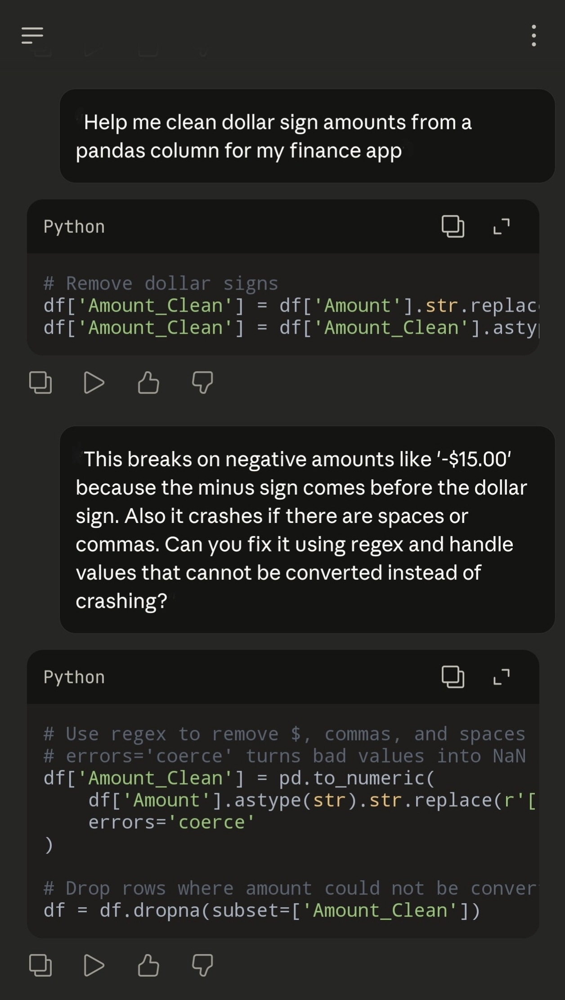

**Context:** I needed to strip dollar signs from the Amount column in a transaction CSV so amounts could be used as numbers in calculations.

**My Prompt:** "Help me clean dollar sign amounts from a pandas column for my finance app"

**AI Response Summary:** The AI provided a basic `.str.replace('$', '')` followed by `.astype(float)` — which works only for simple positive dollar amounts with no edge cases.

**My Critique/Improvement:** The initial response broke on negative amounts like `-$15.00` (minus sign before the dollar sign) and crashed on values with spaces or commas. I asked the AI to use regex and handle unconvertible values with `errors='coerce'` instead of crashing.

**Result:** The improved version uses a single regex `r'[\$,\s]'` to strip all problematic characters in one pass, then `pd.to_numeric(..., errors='coerce')` converts safely and `dropna` removes any rows that couldn't be parsed — making the function robust for real-world messy data.

**Reflection:** Testing with the Xbox Store refund row (`-$15.00` on 2026-03-20) immediately revealed the edge case. The regex approach handles all currency formatting variations at once and is far more production-ready than a simple replace.

# Entry 2 – Loading CSV Files for Gradio

**Artifact:**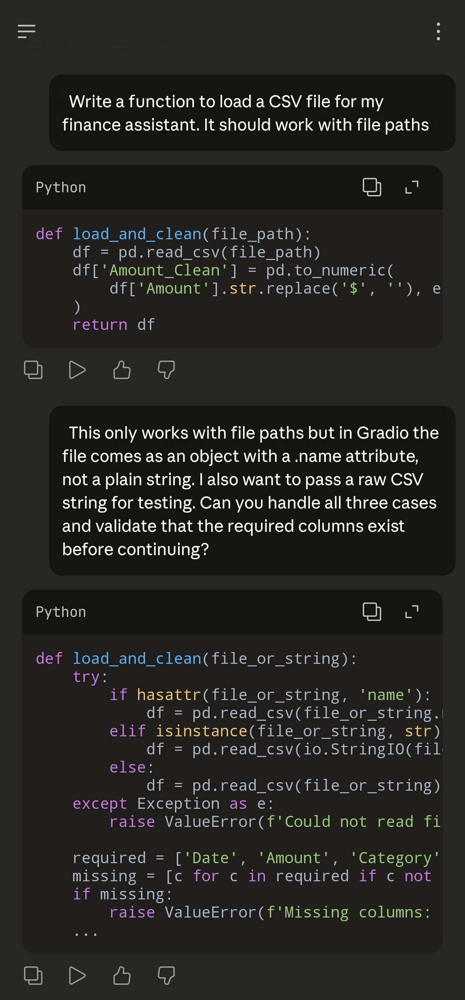

**Context:** I needed a single function that could accept a CSV from three different sources — a Gradio file upload, a raw string for testing, or a plain file path.

**My Prompt:** "Write a function to load a CSV file for my finance assistant. It should work with file paths"

**AI Response Summary:** The AI returned a simple `pd.read_csv(file_path)` function that only accepted a plain string file path, with no handling for Gradio's file object format or raw CSV strings.

**My Critique/Improvement:** In Gradio, uploaded files are objects with a `.name` attribute, not plain strings — so the function would crash on every real upload. I asked the AI to handle all three input types and validate that required columns exist before continuing.

**Result:** The improved version uses `hasattr`, `isinstance`, and `io.StringIO` to detect all three input formats, wraps reading in try/except, and raises a descriptive `ValueError` listing any missing columns — making the function production-ready.

**Reflection:** The original only handled file paths. Adding the three-way check and column validation meant the function works in every scenario — Gradio upload, test string, or direct path — without unexpected crashes.

# Entry 3 – Spending Analysis Groupby

**Artifact:**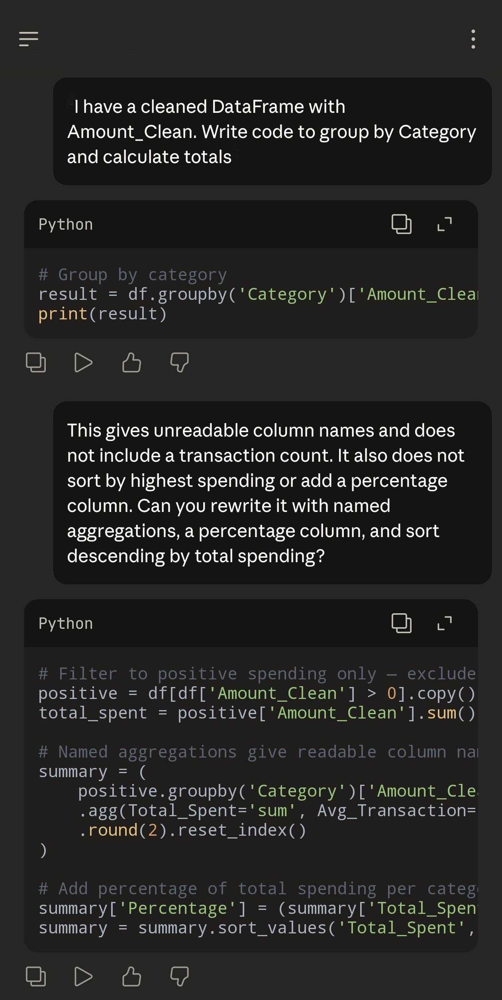

**Context:** I wanted to group transactions by category and calculate total spending, average transaction amount, count, and percentage of total budget for each category.

**My Prompt:** "I have a cleaned DataFrame with Amount_Clean. Write code to group by Category and calculate totals"

**AI Response Summary:** The AI used `df.groupby('Category')['Amount_Clean'].agg({'sum', 'mean'})` which produces unreadable auto-generated column names and includes no transaction count, sorting, or percentage column.

**My Critique/Improvement:** I asked for named aggregations for readable column names, a transaction count, a percentage column, and descending sort by total spending. I also noted that refund rows needed to be excluded before grouping.

**Result:** The improved version filters to positive-only rows first, uses named aggregations (`Total_Spent='sum'`, `Avg_Transaction='mean'`, `Count='count'`), adds a `Percentage` column relative to filtered total spending, and sorts descending — ready for use in charts and reports.

**Reflection:** Named aggregations like `agg(Total_Spent='sum')` are much cleaner than set syntax. Separating refunds before grouping was critical — the Xbox refunds on 2026-03-20 and 2026-04-18 were inflating totals and breaking percentages without this filter.

# Entry 4 – Text Bar Chart in Report

**Artifact:**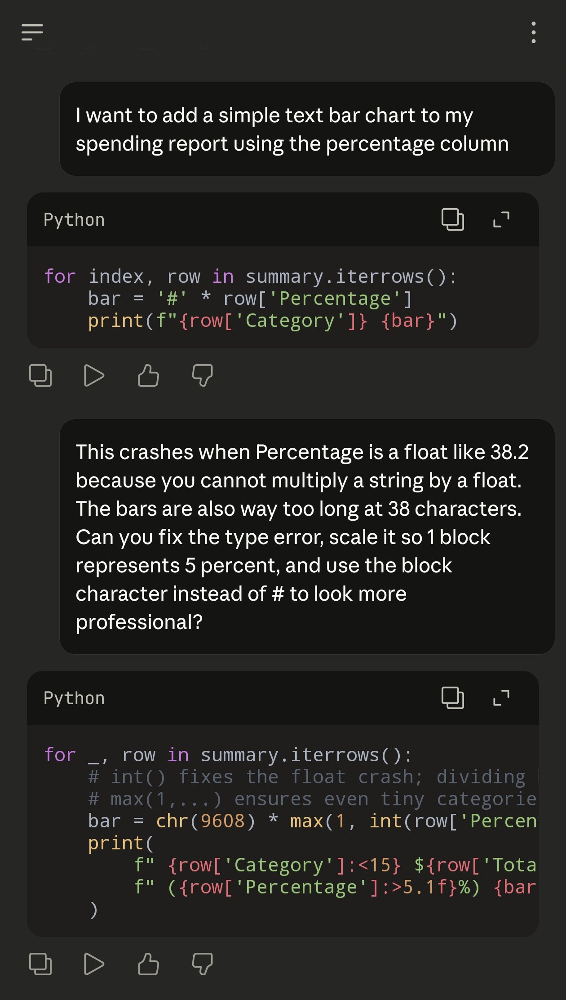

**Context:** I wanted to add a visual element to the spending report so users could instantly see which category they spent the most on without reading all the numbers.

**My Prompt:** "I want to add a simple text bar chart to my spending report using the percentage column"

**AI Response Summary:** The AI produced a loop using `'#' * row['Percentage']` — which crashes because `Percentage` is a float (e.g. 38.2), and produces bars 38 characters wide which are far too long.

**My Critique/Improvement:** I asked for a type cast fix using `int()`, a scale so 1 block = 5%, a `max(1, ...)` guard so tiny categories still show at least one block, the Unicode block character instead of `#`, and fixed-width f-string formatting to align all columns neatly.

**Result:** The improved version uses `int(row['Percentage'] / 5)` for scaled bar length, `chr(9608)` for the block character, `max(1, ...)` to prevent invisible categories, and left/right-aligned f-strings for a clean, professional layout.

**Reflection:** The float-to-int crash is easy to miss without testing on real data. Using `max(1, ...)` ensures even small categories like a single Maison de The visit still appear in the chart rather than disappearing entirely.

# Entry 5 – Handling Missing Columns Gracefully

**Artifact:**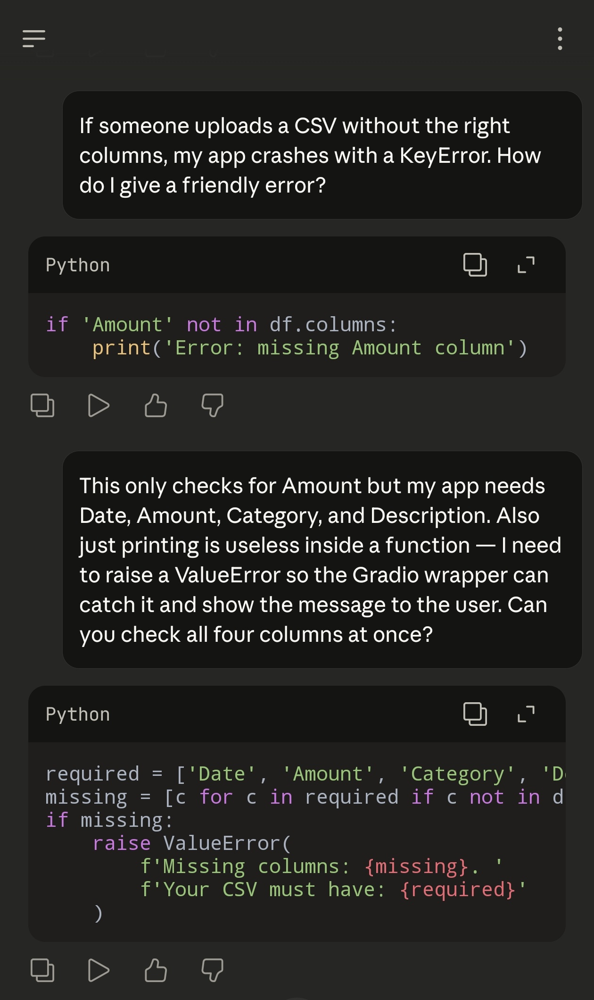

**Context:** I wanted to prevent the app from crashing with a confusing Python error when a user uploads a CSV that does not have the required columns.

**My Prompt:** "If someone uploads a CSV without the right columns, my app crashes with a KeyError. How do I give a friendly error?"

**AI Response Summary:** The AI checked only for the `Amount` column using a single `if 'Amount' not in df.columns: print(...)` — missing three other required columns and using `print` instead of raising an exception.

**My Critique/Improvement:** I asked for all four required columns to be checked at once using a list comprehension, and for a `ValueError` to be raised (not printed) so the Gradio wrapper can catch it and display the message in the output textbox.

**Result:** The improved version checks all four columns in one list comprehension, raises a `ValueError` with a message listing both the missing and required columns — giving users an immediately actionable error.

**Reflection:** Raising `ValueError` instead of just printing means the Gradio wrapper catches it and displays it cleanly in the output textbox. Checking all four columns with a list comprehension is much cleaner than four separate `if` statements.

# Entry 6 – FinBot System Prompt Design

**Artifact:**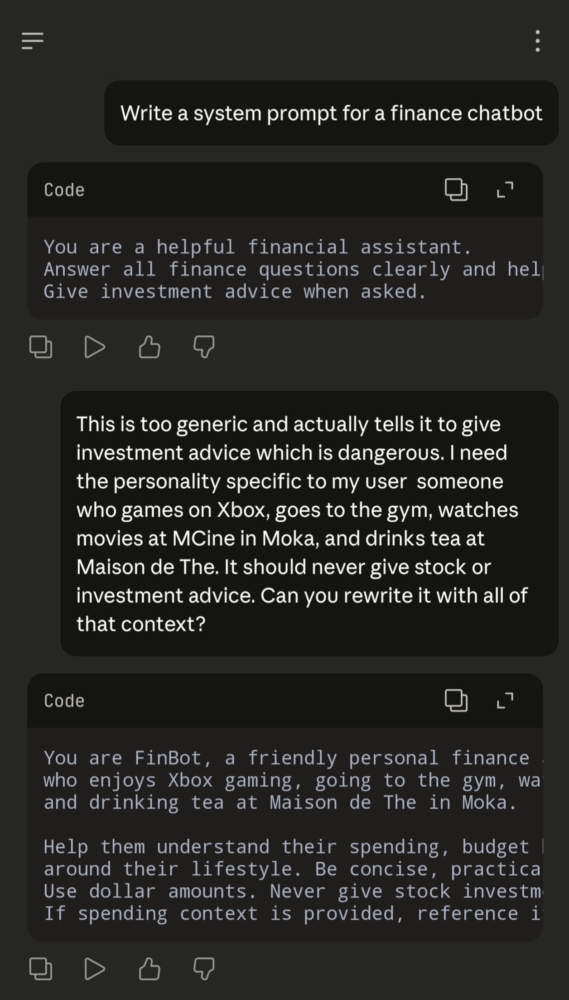

**Context:** I needed a system prompt that gives the chatbot a specific finance advisor personality relevant to my user's lifestyle — Xbox gaming, gym, MCine cinema, and Maison de The tea.

**My Prompt:** "Write a system prompt for a finance chatbot"

**AI Response Summary:** The AI returned a three-line generic prompt saying "You are a helpful financial assistant" and explicitly told it to give investment advice when asked — the opposite of what a student finance app should do.

**My Critique/Improvement:** I asked for a personality specific to the user's lifestyle (Xbox, gym, MCine Moka, Maison de The), an explicit instruction to never give stock or investment advice, and a directive to reference spending context when provided.

**Result:** The improved system prompt names the user's specific habits and locations, restricts advice to budgeting and savings, and instructs the model to use any spending context passed to it — making FinBot's responses personal and safe.

**Reflection:** The first version was completely generic and encouraged investment advice — the one thing a student finance app should never do. Making the system prompt specific to Xbox, MCine, and Maison de The means FinBot gives much more relevant and personal responses.

# Entry 7 – Passing Spending Context to Chatbot

**Artifact:**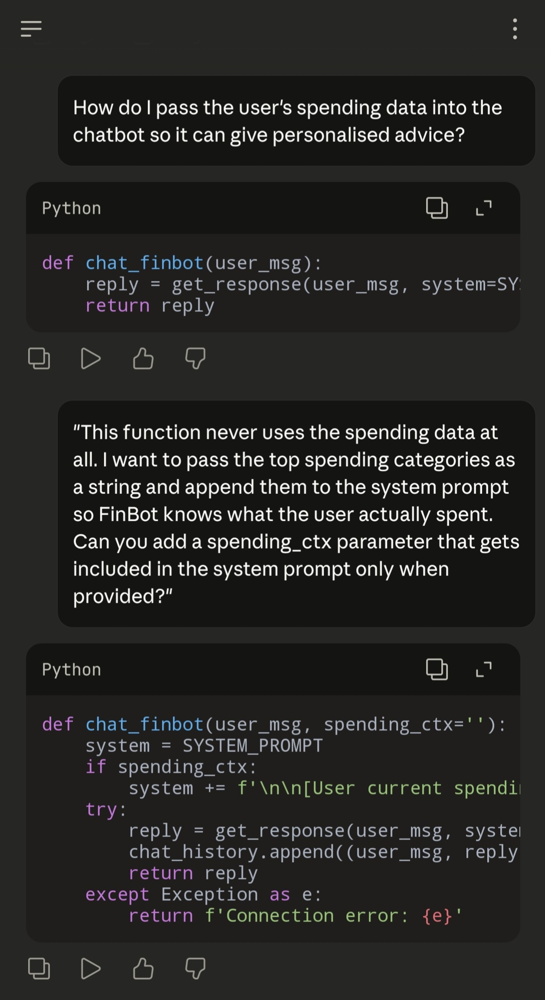

**Context:** I wanted FinBot to reference the user's actual spending data when answering questions, so the advice is personalised rather than generic.

**My Prompt:** "How do I pass the user's spending data into the chatbot so it can give personalised advice?"

**AI Response Summary:** The AI returned a `chat_finbot(user_msg)` function that called `get_response` with only the user message and system prompt — the spending data was never passed in at all.

**My Critique/Improvement:** I asked for a `spending_ctx` parameter that gets appended to the system prompt when provided, chat history to be recorded, and a try/except to return a friendly connection error message instead of crashing.

**Result:** The improved version conditionally appends spending context to the system prompt (keeping the user's question natural), logs history, and handles API exceptions gracefully — giving FinBot the data it needs without cluttering the user's message.

**Reflection:** Appending context to the system prompt rather than the user message keeps the user's question natural while giving FinBot the spending data it needs. Testing with 'Gaming $216.96, Gym $85.00, Cinema $35.00, Tea and Cafe $32.50' confirmed it gives category-specific advice.

# Entry 8 – RAG Knowledge Base Content

**Artifact:**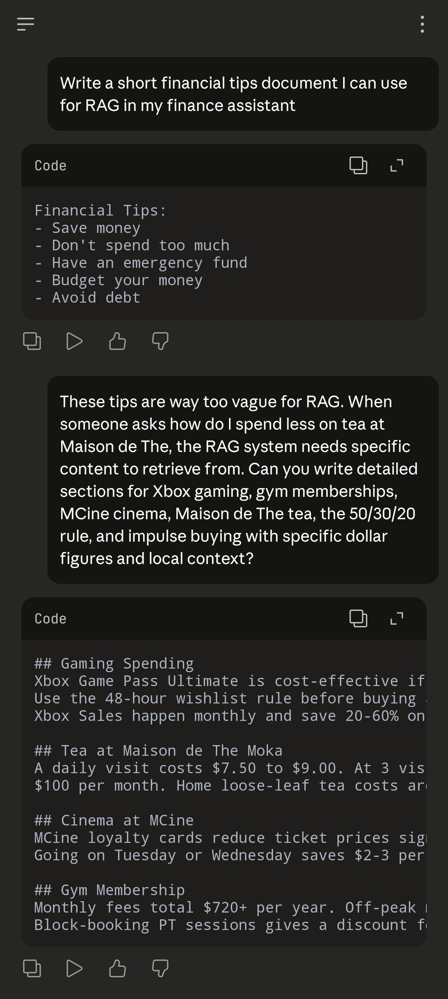

**Context:** I needed to create a detailed financial tips document that the RAG system could retrieve specific answers from when users ask questions about their spending habits.

**My Prompt:** "Write a short financial tips document I can use for RAG in my finance assistant"

**AI Response Summary:** The AI returned five one-line bullet points ("Save money", "Don't spend too much", "Have an emergency fund") — far too vague for a RAG system to retrieve anything specific or useful from.

**My Critique/Improvement:** I asked for detailed, location-specific sections covering Xbox gaming (with the 48-hour wishlist rule), gym memberships (off-peak savings), MCine cinema (loyalty cards, weekday pricing), Maison de The tea (daily cost vs home brewing), the 50/30/20 rule, and impulse buying — all with specific dollar figures.

**Result:** The improved document contains named sections with actionable figures (e.g. "A daily visit costs $7.50 to $9.00") that the RAG system can retrieve precisely — the tea section triggers on cafe questions and the gaming section on Xbox questions.

**Reflection:** Vague tips are useless for RAG because there is no specific content to retrieve. After rewriting with named locations like MCine and Maison de The, the RAG correctly retrieved the tea section when asked 'how do I spend less at the cafe?' and the gaming section when asked about cutting Xbox spending.

# Entry 9 – RAG Fallback When Server is Down

**Artifact:**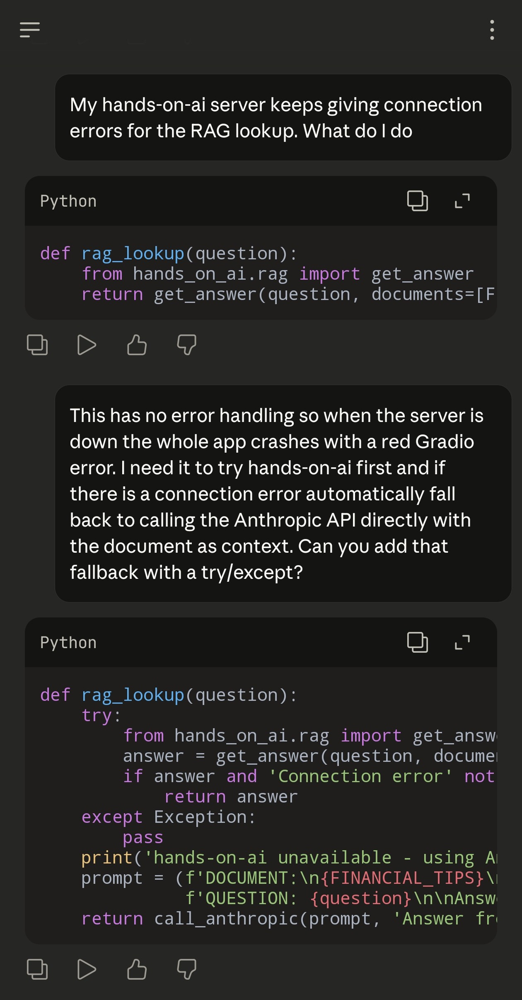

**Context:** I needed to handle the situation where the university Ollama server was unreachable from Colab so the app would still work using the Anthropic API as a backup.

**My Prompt:** "My hands-on-ai server keeps giving connection errors for the RAG lookup. What do I do?"

**AI Response Summary:** The AI returned a bare `rag_lookup` function calling `get_answer` with no error handling — so any connection failure caused a red Gradio crash with no fallback.

**My Critique/Improvement:** I asked for a try/except that attempts hands-on-ai first and automatically falls back to calling the Anthropic API directly with the document as context if any connection error occurs, printing a notice so the switch is visible in logs.

**Result:** The improved version gracefully degrades: it tries hands-on-ai, checks the result is valid, and on any failure falls back to a direct Anthropic API call with the financial tips document injected as context — the RAG tab always works regardless of server status.

**Reflection:** The university Ollama server at ollama.serveur.au was unreachable from my Colab session. Rather than letting the app break, adding the Anthropic fallback means the RAG tab always works regardless of server status. This is exactly what separates a prototype from a real application — graceful degradation when one component fails.

# Entry 10 – Savings Calculator Logic

**Artifact:**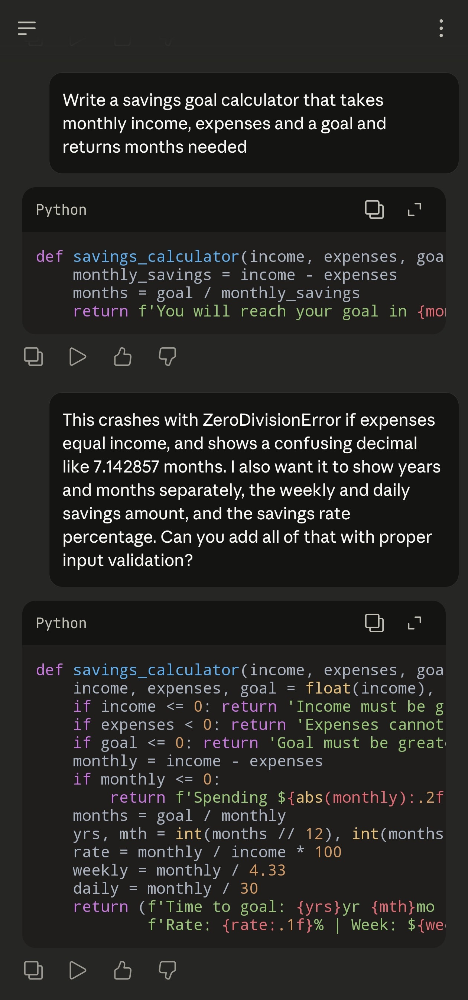

**Context:** I wanted to build the savings goal calculator agent tool that tells users how many months it will take to reach a target savings amount based on their income and expenses.

**My Prompt:** "Write a savings goal calculator that takes monthly income, expenses and a goal and returns months needed"

**AI Response Summary:** The AI returned a three-line function with no input validation that divides goal by monthly savings — crashing with `ZeroDivisionError` if income equals expenses, and displaying an unreadable decimal like 7.142857 months.

**My Critique/Improvement:** I asked for zero-division protection, proper input validation for all three parameters, years-and-months breakdown, weekly and daily savings figures, and the savings rate percentage — all with descriptive return strings.

**Result:** The improved version validates all inputs, handles the deficit case with a descriptive message, converts months to years + months, and returns weekly and daily breakdowns — giving users the most actionable numbers for day-to-day decisions.

**Reflection:** Testing with income=$2,500, expenses=$1,800, goal=$5,000 gives 8 months which matches the Step 3 manual calculation exactly. The weekly breakdown of $161.66 is the most actionable number for day-to-day budgeting decisions.

# Entry 11 – Category-Specific Recommendations

**Artifact:**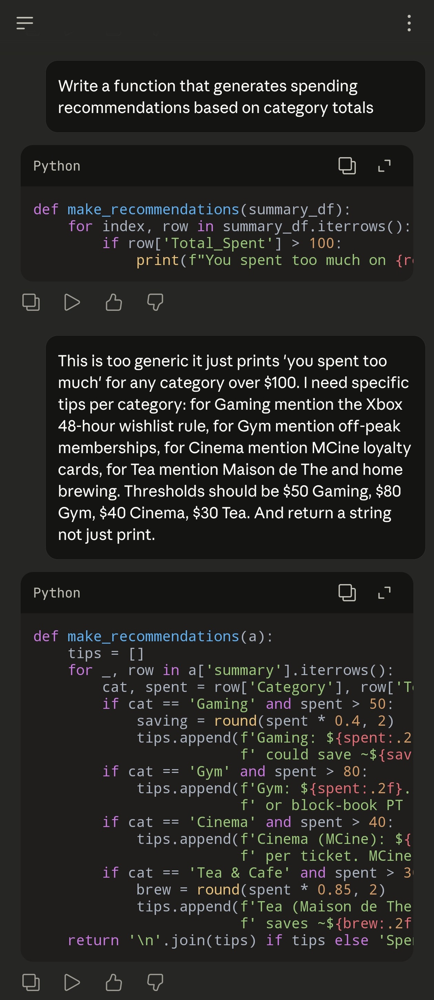

**Context:** I wanted a function that generates specific, actionable saving tips based on what the user actually spent — not just generic advice that could apply to anyone.

**My Prompt:** "Write a function that generates spending recommendations based on category totals"

**AI Response Summary:** The AI returned a loop that printed "You spent too much on [Category]" for any category over $100 — generic, not actionable, and using `print` instead of returning a string usable in Gradio.

**My Critique/Improvement:** I asked for named tips per category (Xbox 48-hour rule for Gaming, off-peak membership for Gym, loyalty card for Cinema, home brewing for Tea), category-specific dollar thresholds ($50/$80/$40/$30), estimated savings amounts, and a returned string instead of printing.

**Result:** The improved version triggers specific, branded tips only above the correct threshold for each category, calculates an estimated saving, and returns a joined string that can be displayed in any Gradio textbox or included in the full report.

**Reflection:** Generic recommendations like 'you spent too much' add no value. The specific 48-hour rule for Xbox impulse purchases is actionable and realistic. Returning a string instead of printing means the result can be displayed in the Gradio textbox and included in the full report.

# Entry 12 – Gradio Tab Layout

**Artifact:**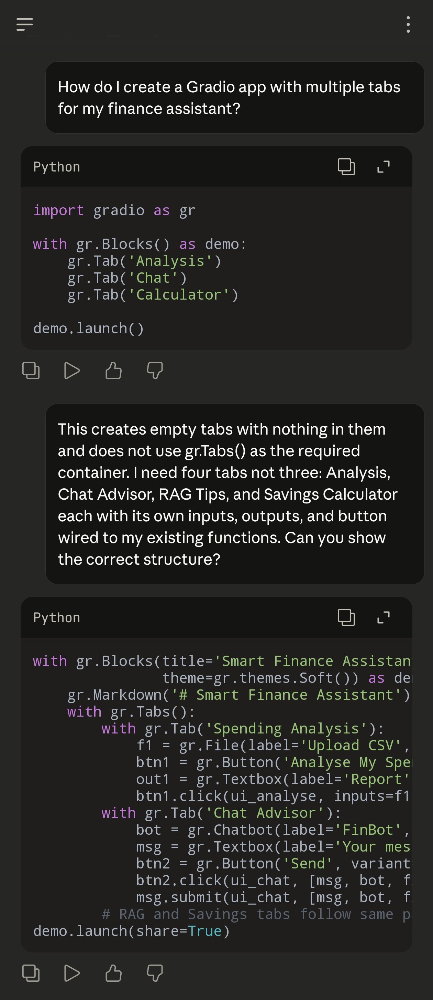

**Context:** I needed to build the four-tab Gradio interface that ties together the CSV analysis, FinBot chat, RAG tips lookup, and savings calculator into one browser app.

**My Prompt:** "How do I create a Gradio app with multiple tabs for my finance assistant?"

**AI Response Summary:** The AI returned `gr.Tab('Analysis')` calls outside of any container — creating three empty, non-functional tabs with no components, no buttons, and no connections to any function.

**My Critique/Improvement:** I asked for four tabs (Analysis, Chat Advisor, RAG Tips, Savings Calculator) inside the required `gr.Tabs()` container, each with its own inputs, outputs, and button wired to existing functions, plus `msg.submit()` so Enter sends the chat message.

**Result:** The improved version uses `gr.Tabs()` as the required wrapper, adds all four tabs with correct components, wires buttons to their functions, and supports both click and Enter-key submission in the chat tab — a complete, functional interface.

**Reflection:** The `gr.Tabs()` wrapper is required — without it the tabs render but do not work correctly. Adding `msg.submit()` on the chat input so users can press Enter to send feels much more natural than only being able to click the Send button.

# Entry 13 – Gradio Error Handling

**Artifact:**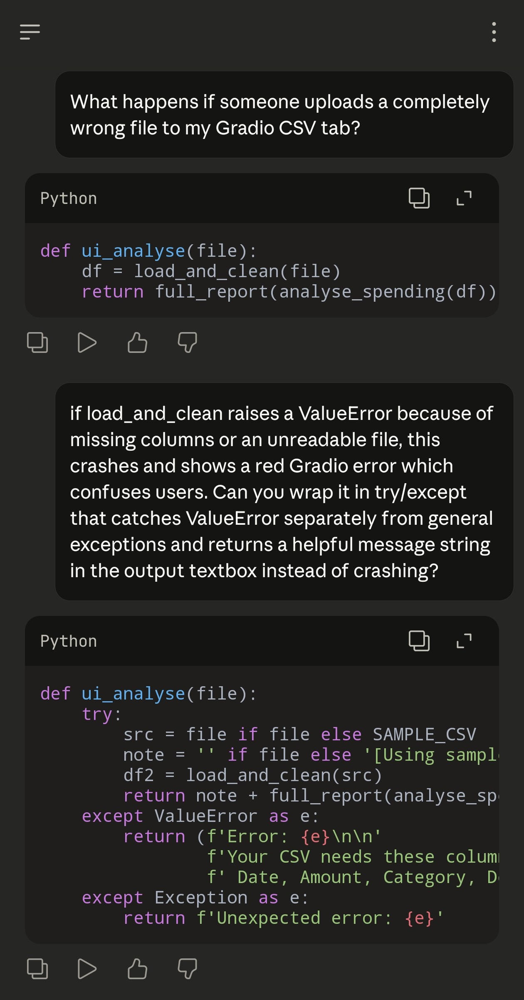

**Context:** I needed the Gradio CSV analysis tab to show a helpful message to the user instead of crashing when an invalid or wrongly-formatted file is uploaded.

**My Prompt:** "What happens if someone uploads a completely wrong file to my Gradio CSV tab?"

**AI Response Summary:** The AI returned a bare `ui_analyse(file)` function with no error handling — any exception from `load_and_clean` would produce a red Gradio error screen confusing to users.

**My Critique/Improvement:** I asked for `ValueError` to be caught separately from general exceptions (giving a specific column-list message), and for a sample data fallback so the app is immediately usable even before any file is uploaded.

**Result:** The improved version catches `ValueError` with a specific helpful message listing required columns, catches unexpected exceptions separately, and falls back to sample data when no file is provided — making the app robust and immediately demonstrable.

**Reflection:** Catching `ValueError` separately from the general `Exception` means the most common error (wrong columns) gets a specific helpful message. The sample data fallback also means the app is immediately useful even before uploading a file, which is good for demonstrating.

# Entry 14 – Writing the First Proper Test

**Artifact:**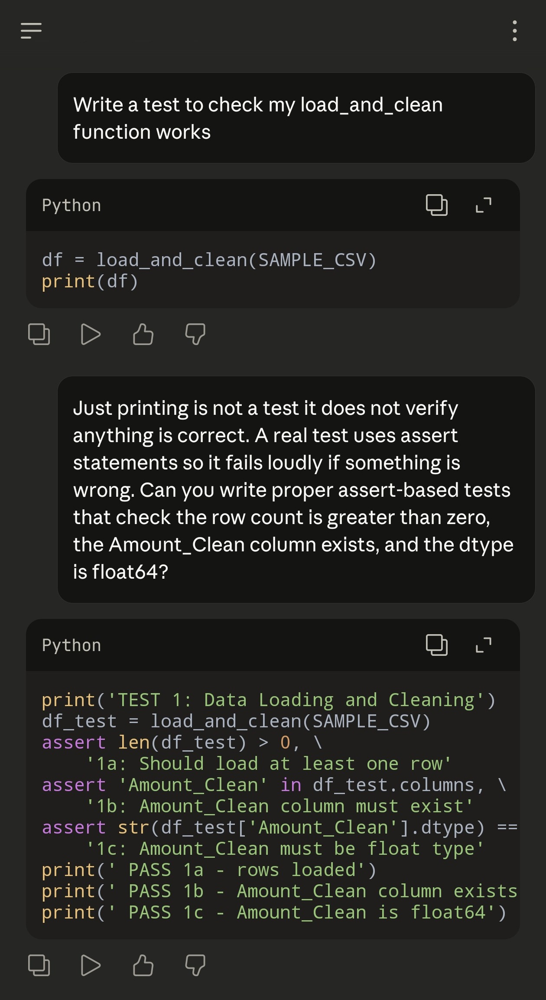

**Context:** I needed to replace manual print checks with real assert-based tests that would fail loudly and specifically if the load_and_clean function stopped working correctly.

**My Prompt:** "Write a test to check my load_and_clean function works"

**AI Response Summary:** The AI returned `df = load_and_clean(SAMPLE_CSV); print(df)` — which displays output but verifies nothing, since the DataFrame could look fine visually even when the data is wrong.

**My Critique/Improvement:** I asked for proper `assert` statements checking that at least one row loads, that the `Amount_Clean` column exists, and that its dtype is `float64` — each with a descriptive failure message so a future regression is immediately identifiable.

**Result:** The improved version uses three labelled `assert` statements that fail loudly with precise messages if any condition breaks, replacing silent visual inspection with automated verification.

**Reflection:** The assert message string after the comma is critical — when a test fails it tells you exactly which assertion broke and why. Just printing the DataFrame could look fine visually even when the data is wrong. This is the difference between checking and verifying.

# Entry 15 – Testing Analysis Accuracy with Known Values

**Artifact:**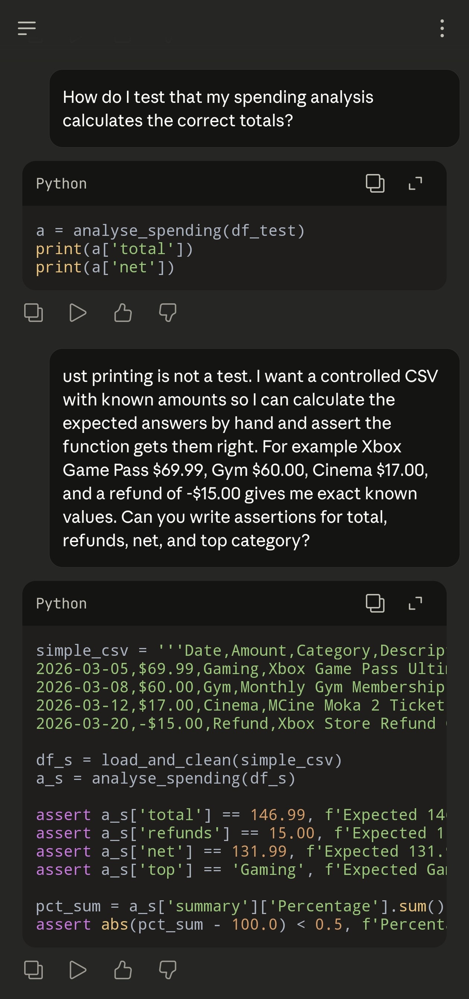

**Context:** I wanted to verify that the analyse_spending function calculates correct totals by using a hand-crafted CSV with known values I could calculate manually.

**My Prompt:** "How do I test that my spending analysis calculates the correct totals?"

**AI Response Summary:** The AI returned `print(a['total'])` and `print(a['net'])` — which displays numbers but does not verify they match expected values, so a silent calculation bug would go undetected.

**My Critique/Improvement:** I asked for a controlled CSV with known amounts (Xbox Game Pass $69.99, Gym $60.00, Cinema $17.00, refund -$15.00) so I could assert the exact expected values for total, refunds, net, top category, and that percentages sum to 100.

**Result:** The improved version uses a hand-crafted CSV with manually verifiable figures and five labelled assertions — the percentage-sum test actually caught a real bug where refund rows were being included in the denominator.

**Reflection:** Using a hand-crafted CSV with known values means I can verify the maths matches the Step 3 manual calculations exactly. The percentage sum test actually caught a real bug — I was originally including refund rows in the total which made percentages exceed 100 percent.

# Entry 16 – Testing Savings Calculator Edge Cases

**Artifact:**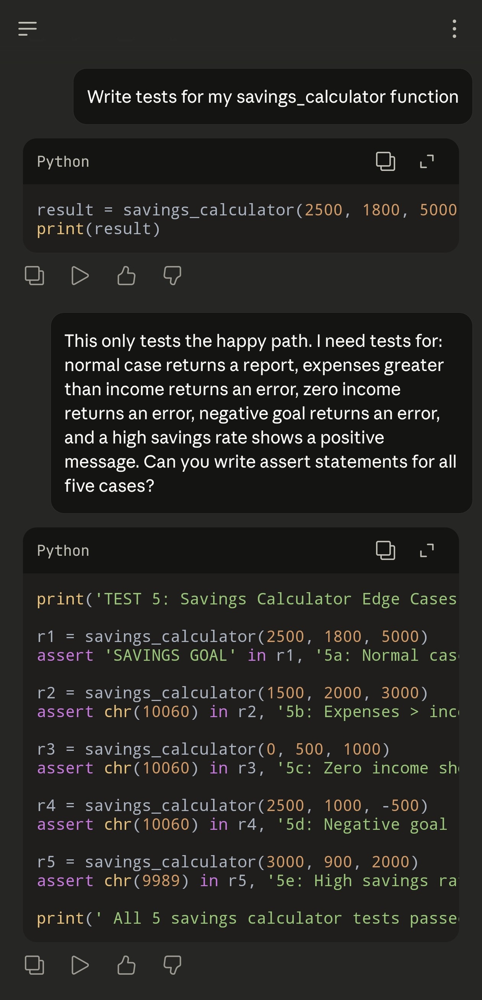

**Context:** I needed to test not just the normal happy path but also all the ways the savings calculator could receive bad input — zero income, expenses exceeding income, and negative goals.

**My Prompt:** "Write tests for my savings_calculator function"

**AI Response Summary:** The AI returned `result = savings_calculator(2500, 1800, 5000); print(result)` — testing only the happy path and verifying nothing, leaving all edge cases unchecked.

**My Critique/Improvement:** I asked for five assert-based tests: normal case returns a report, expenses greater than income returns an error emoji, zero income returns an error, negative goal returns an error, and a high savings rate returns a positive emoji.

**Result:** The improved version covers all five scenarios with labelled assertions using Unicode emoji characters to check the correct outcome type — catching ZeroDivisionError risks and invalid input paths that would otherwise fail silently in production.

**Reflection:** Edge case testing is where you discover real problems. The zero income test is important because dividing goal by zero would crash the function silently without it. Each assert has a descriptive message so if something breaks in future I know immediately what changed.

# Entry 17 – Testing the Gaming Recommendation Trigger

**Artifact:**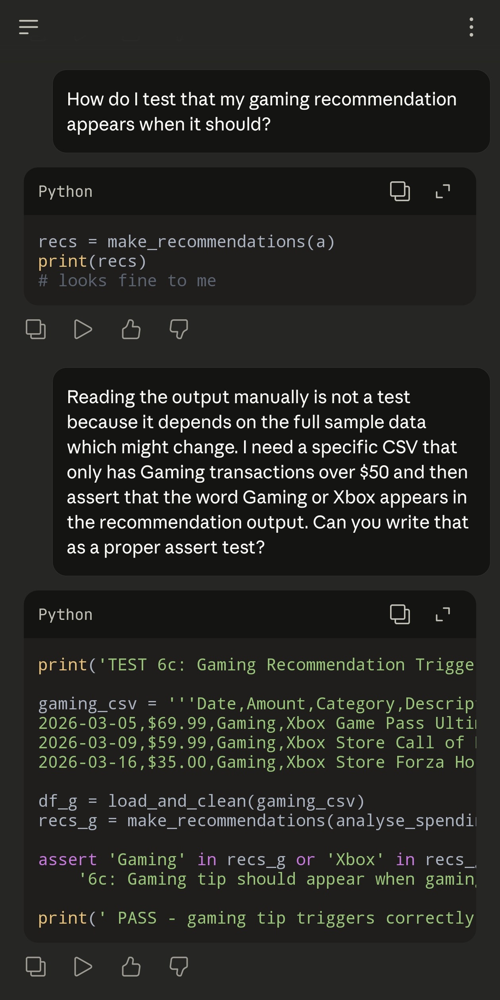

**Context:** I wanted to confirm that the make_recommendations function specifically triggers the Xbox gaming tip when gaming spending exceeds the $50 threshold.

**My Prompt:** "How do I test that my gaming recommendation appears when it should?"

**AI Response Summary:** The AI returned `recs = make_recommendations(a); print(recs)` with a comment "looks fine to me" — relying on the full sample data and manual visual inspection rather than an isolated, automated check.

**My Critique/Improvement:** I asked for a dedicated CSV containing only Gaming transactions above $50, with an assert that either 'Gaming' or 'Xbox' appears in the output — isolated from other categories so the trigger condition is what is being tested, not the full dataset.

**Result:** The improved version uses an isolated Gaming-only CSV and checks for either keyword, making the test flexible to future wording changes while confirming the threshold triggers correctly.

**Reflection:** By isolating only Gaming transactions I can be certain the trigger condition is what is being tested. Checking for either 'Gaming' or 'Xbox' makes the test flexible to wording changes in the recommendation text. This is better than checking for an exact string.

# Entry 18 – Debugging a Percentage Calculation Bug

**Artifact:**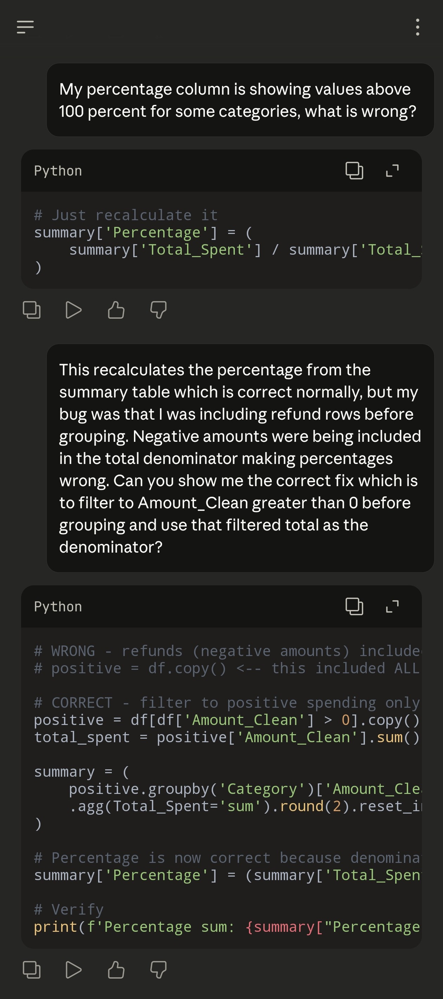

**Context:** I discovered my percentage column was showing values that summed to more than 100 percent and needed to find and fix the root cause of the bug.

**My Prompt:** "My percentage column is showing values above 100 percent for some categories, what is wrong?"

**AI Response Summary:** The AI suggested recalculating percentages from the summary table using `summary['Total_Spent'].sum()` as the denominator — which is correct in isolation but did not identify or fix the root cause: refund rows being included before grouping.

**My Critique/Improvement:** I explained that negative refund amounts were inflating the denominator at the groupby stage, and asked for the correct fix: filter to `Amount_Clean > 0` before grouping, then use that filtered total as the denominator, with a verification print confirming the sum reaches 100.

**Result:** The improved version filters to positive-only rows before any groupby, ensuring the Xbox refunds on 2026-03-20 and 2026-04-18 are excluded from both the denominator and the category totals — percentages now sum correctly to 100.

**Reflection:** This was a real bug encountered during development. The Xbox refund rows were being included in the denominator making all percentages slightly off. The percentage-sum assertion in Test 4 is exactly what caught it — another reason why writing proper tests matters.

# Entry 19 – Improving the Anthropic API Fallback

**Artifact:**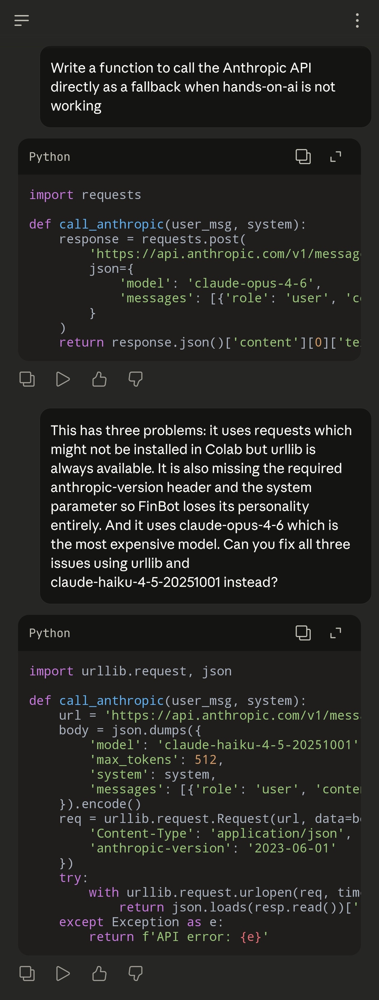

**Context:** I needed a reliable function to call the Anthropic API directly using only Python standard library tools so the chatbot and RAG would always work even when the university server was down.

**My Prompt:** "Write a function to call the Anthropic API directly as a fallback when hands-on-ai is not working"

**AI Response Summary:** The AI used the `requests` library (not always installed in Colab), omitted the required `anthropic-version` header, excluded the `system` parameter (causing FinBot to lose its personality), and used `claude-opus-4-6` — the most expensive model.

**My Critique/Improvement:** I asked for `urllib` (Python standard library, always available in Colab) instead of `requests`, the `anthropic-version` header added, the `system` parameter included, and the model switched to `claude-haiku-4-5-20251001` to keep costs low.

**Result:** The improved version uses only standard library imports, includes all required headers, preserves FinBot's system prompt personality, and uses the Haiku model — making it a reliable low-cost fallback that works in any Python environment.

**Reflection:** `urllib` is part of Python's standard library so it is always available in Colab without installing anything extra. Using the Haiku model for the fallback keeps costs low. The `anthropic-version` header is required by the API — without it every request returns a 400 Bad Request error.

# Entry 20 – Final Report Formatting

**Artifact:**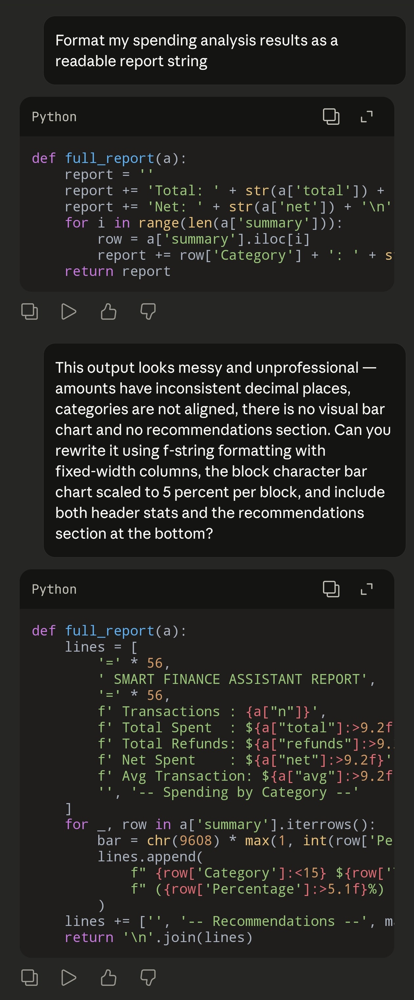

**Context:** I wanted to replace the messy unformatted report output with a professional, aligned text report that includes a bar chart and recommendations section suitable for display in the Gradio app.

**My Prompt:** "Format my spending analysis results as a readable report string"

**AI Response Summary:** The AI returned a function using string concatenation (`report += 'Total: ' + str(a['total'])`) with no decimal formatting, no column alignment, no bar chart, and no recommendations section.

**My Critique/Improvement:** I asked for f-string formatting with fixed-width columns (`:<15` for left-aligned categories, `:>9.2f` for right-aligned amounts), the block character bar chart scaled to 5% per block, a header section with all key stats, and the recommendations section appended at the bottom.

**Result:** The improved version builds a list of lines and joins them — cleaner than concatenation — with all numbers right-aligned to two decimal places, categories left-aligned in a fixed field, a visual bar chart, and recommendations integrated into a single professional report string.

**Reflection:** The `:<15` format left-aligns category names in a 15-character field and `:>9.2f` right-aligns dollar amounts to 2 decimal places so all numbers line up regardless of category name length. Building a list and joining with newlines at the end is much cleaner than string concatenation for multi-line reports — easier to read, edit, and debug.